In [49]:
from astropy.io import fits
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.modeling import models, fitting
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob, copy
from scipy import stats
from itertools import chain

plt.rcParams['figure.figsize'] = (18, 12)

In [50]:
#drive.mount('/content/drive/', force_remount=True)
path_drive = "../datasets/Spectroscopy/"

# Bias

In [51]:
files_bias = glob.glob(path_drive+"bias/*.fit")

In [52]:
files_bias

['../datasets/Spectroscopy/bias/Image-025.fit',
 '../datasets/Spectroscopy/bias/Image-027.fit',
 '../datasets/Spectroscopy/bias/Image-024.fit',
 '../datasets/Spectroscopy/bias/Image-026.fit',
 '../datasets/Spectroscopy/bias/Image-023.fit']

In [53]:
files_bias[0]

'../datasets/Spectroscopy/bias/Image-025.fit'

In [54]:
#Stack bias frames and generate Masterbias

hdu = fits.open(files_bias[0])
ny, nx = np.shape(hdu[0].data)
allbias = np.zeros((len(files_bias),ny,nx))

for ind, ff in enumerate(files_bias):
    hdu = fits.open(ff)
    allbias[ind,...] = hdu[0].data
    hdu.close()

masterbias = np.mean(allbias, axis=0)
del allbias

1371.8


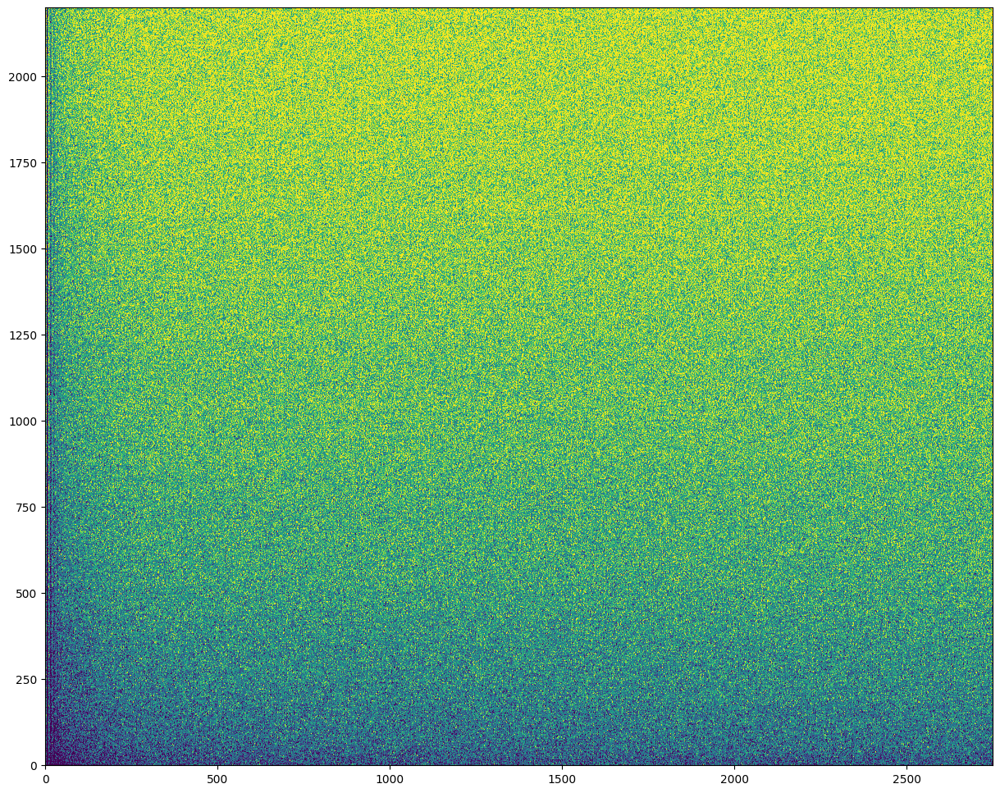

In [55]:
print(np.median(masterbias))
plt.imshow(masterbias,clim=[1365,1375], origin='lower')

# Flat

foto bianca molto corta con esposizione cortissima, cerco di capire in quali punti è più sensibile di altri il mio sensore, poi trovo la mia mediana e quando faccio la mia scienza divido per la mediana  

A differenza del bias, non toglie rumore, ma serve per calibrare la sensibilità

In [56]:
files_flat = glob.glob(path_drive+"flat/*.fit")


In [57]:
files_flat

['../datasets/Spectroscopy/flat/Image-020.fit',
 '../datasets/Spectroscopy/flat/Image-019.fit',
 '../datasets/Spectroscopy/flat/Image-016.fit',
 '../datasets/Spectroscopy/flat/Image-021.fit',
 '../datasets/Spectroscopy/flat/Image-018.fit',
 '../datasets/Spectroscopy/flat/Image-017.fit']

In [58]:
#Stack flat frames and subtract bias (do not normalize flat to 1 yet)

flat = np.zeros((len(files_flat),ny,nx))

for ind, ff in enumerate(files_flat):
    hdu = fits.open(ff)
    flat[ind,...] = hdu[0].data - masterbias
    hdu.close()
    
masterflat = np.mean(flat, axis=0)
del flat

Same amount of photons on the various wavelength, but then it changes on the right, so we use this to do a calibration, we want median of 1

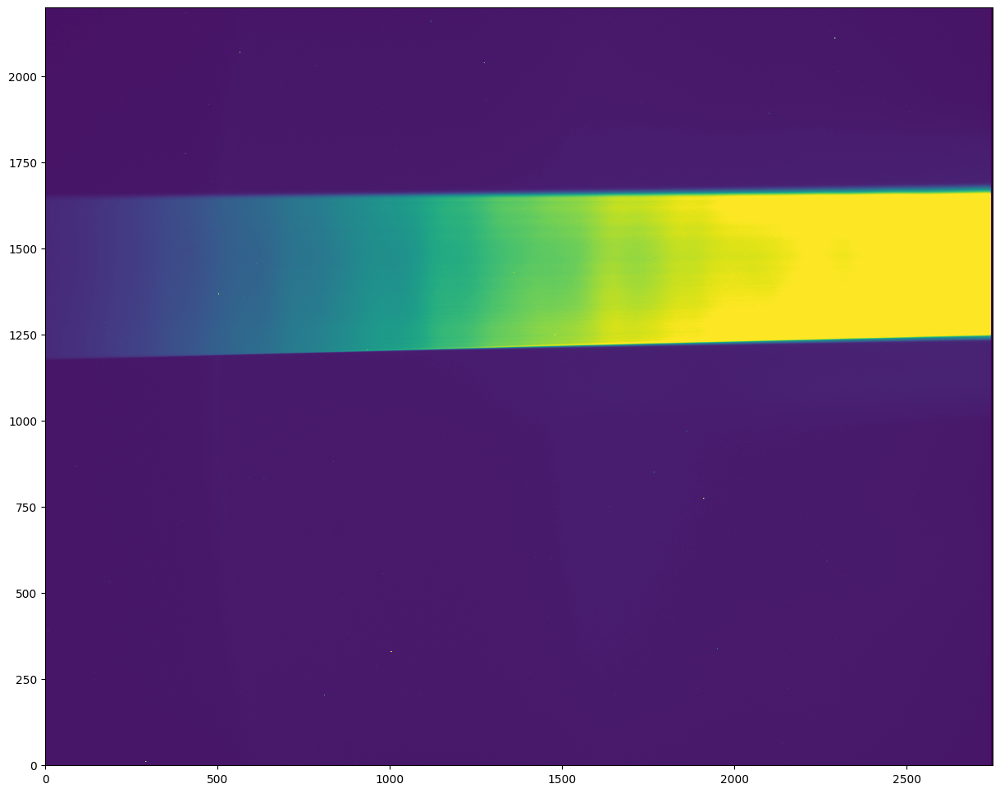

In [59]:
plt.imshow(masterflat,clim=[0,6000], origin='lower')
plt.show()

# Convolutional edges detection

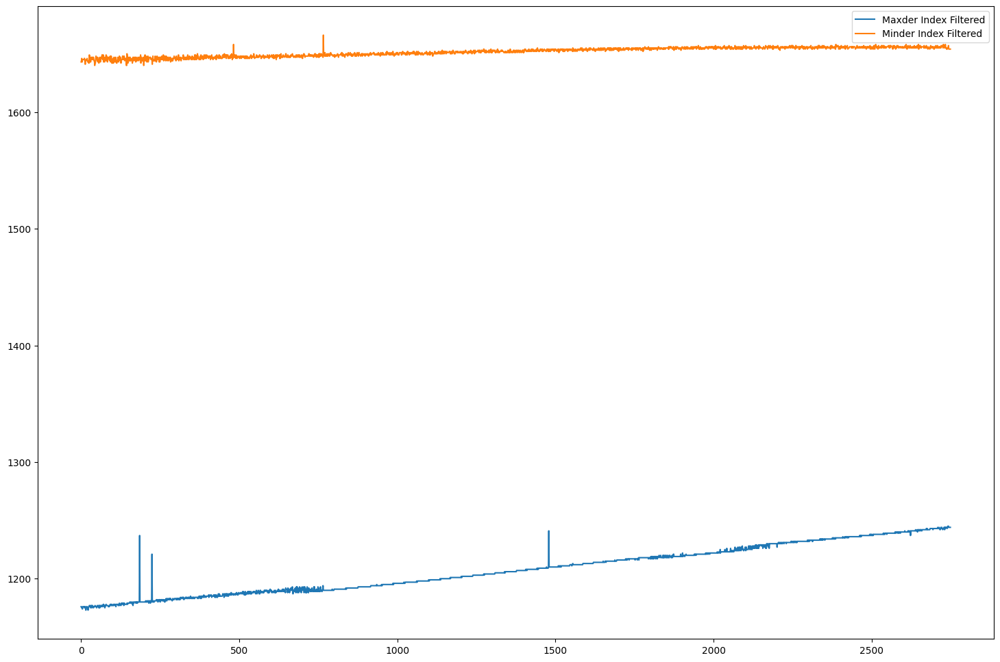

In [60]:
import numpy as np
import matplotlib.pyplot as plt

smoothed_signal = np.apply_along_axis(lambda x: np.convolve(x, np.ones(10), mode='valid'), axis=0, arr=masterflat)
derivative = np.gradient(smoothed_signal, axis=0)
    
edgeup_conv = np.argmax(derivative, axis=0)
edgedn_conv = np.argmin(derivative, axis=0)

maxder_mean = np.mean(edgeup_conv)
minder_mean = np.mean(edgedn_conv)

maxder_outliers = np.abs(edgeup_conv - maxder_mean) > 50
minder_outliers = np.abs(edgedn_conv - minder_mean) > 50

for outliers, index in [(maxder_outliers, edgeup_conv), (minder_outliers, edgedn_conv)]:
    positions = np.where(outliers)
    for i in positions[0]:
        index[i] = index[i-1]

plt.plot(edgeup_conv, label='Maxder Index Filtered')
plt.plot(edgedn_conv, label='Minder Index Filtered')
plt.legend()
plt.show()


(0.0, 2400.0)

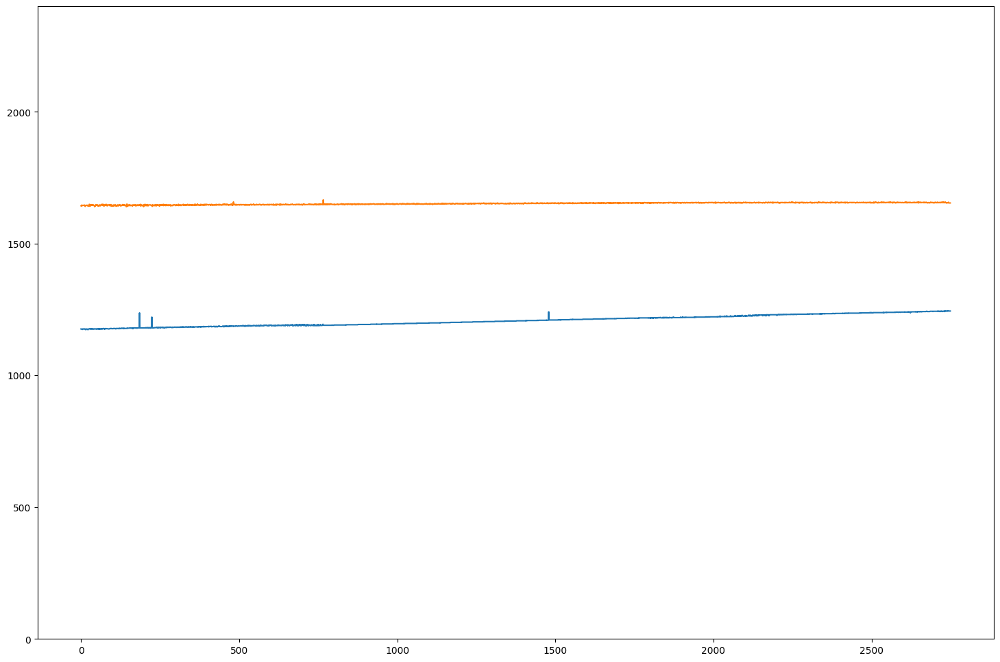

In [61]:
plt.plot(edgeup_conv)
plt.plot(edgedn_conv)
plt.ylim(0,2400)


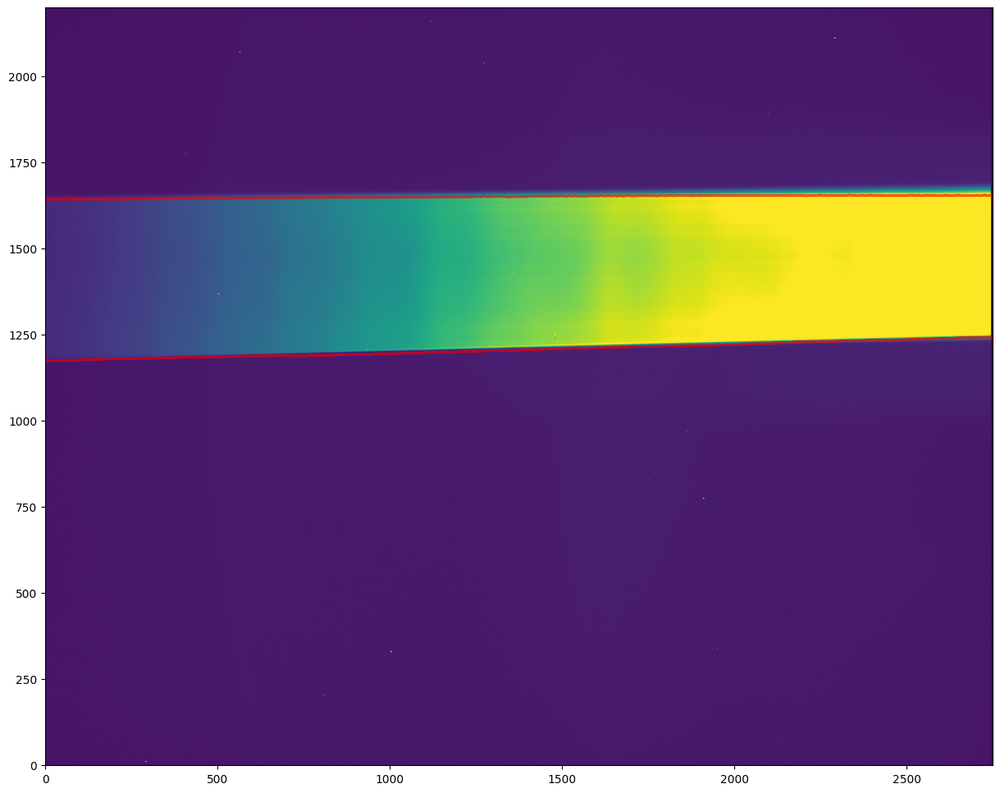

In [62]:
#plot
xarr = np.arange(nx)
plt.imshow(masterflat,clim=[0,6000], origin='lower')
plt.scatter(xarr, edgeup_conv,s=0.01,c='r', lw=2)
plt.scatter(xarr, edgedn_conv,s=0.01,c='r', lw=2)

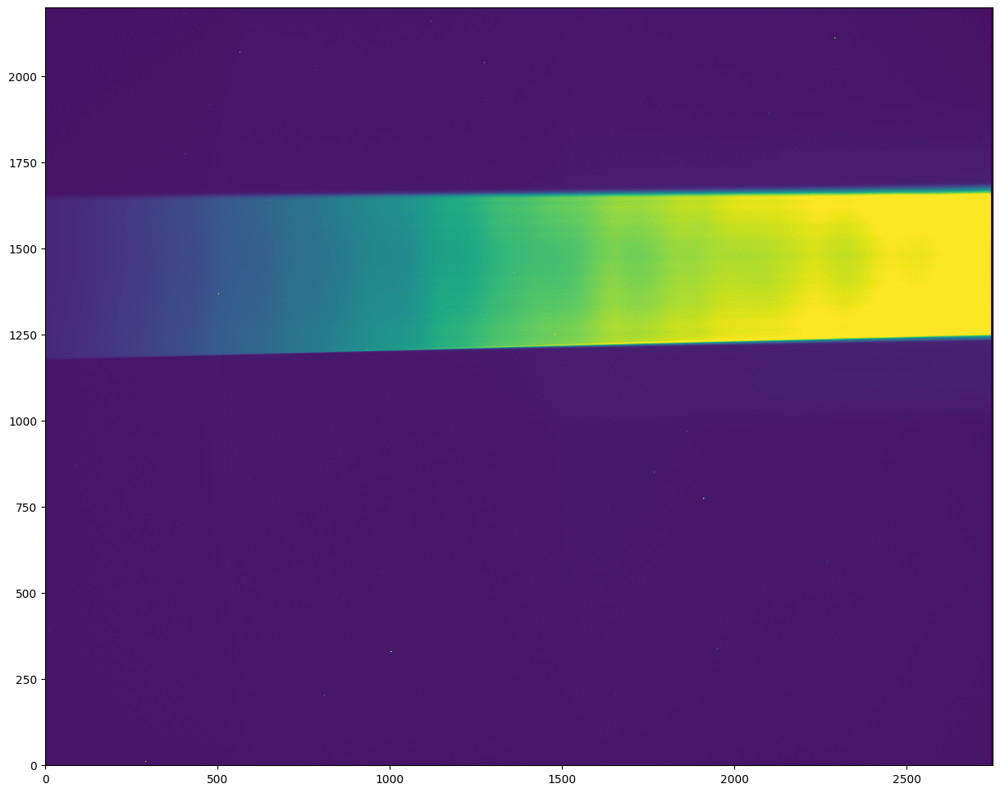

In [63]:
#Generate a mask of pixels bound by the slit edges and normalize flat to a mean of one in that region
normflat = copy.deepcopy(masterflat)
column = 0

# find the mean of the column bounded by the slit edges
for column in range(nx):    
    mean = np.mean(masterflat[:,edgeup_conv[column]:edgedn_conv[column]])
    normflat[:,column] /= mean

plt.imshow(normflat,clim=[0,5], origin='lower')


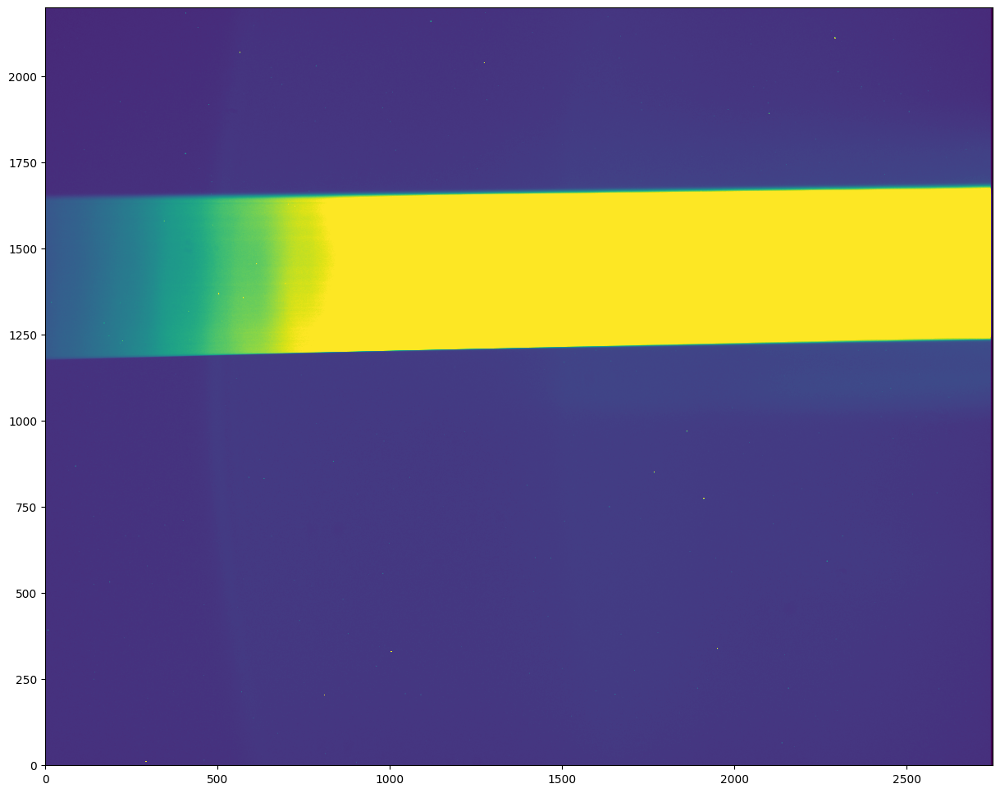

In [64]:
plt.imshow(normflat,clim=[0,2], origin='lower')

# Science image loading

In [65]:
IMMAG = glob.glob(path_drive+"science/HD3360_30s.fit")
IMMAG

['../datasets/Spectroscopy/science/HD3360_30s.fit']

In [66]:
IMMAG_data = fits.open(IMMAG[0])[0].data

/tmp/ipykernel_4855/1227847744.py:4: RuntimeWarning: divide by zero encountered in divide
  IMMAG_0_flat = IMMAG_0/normflat


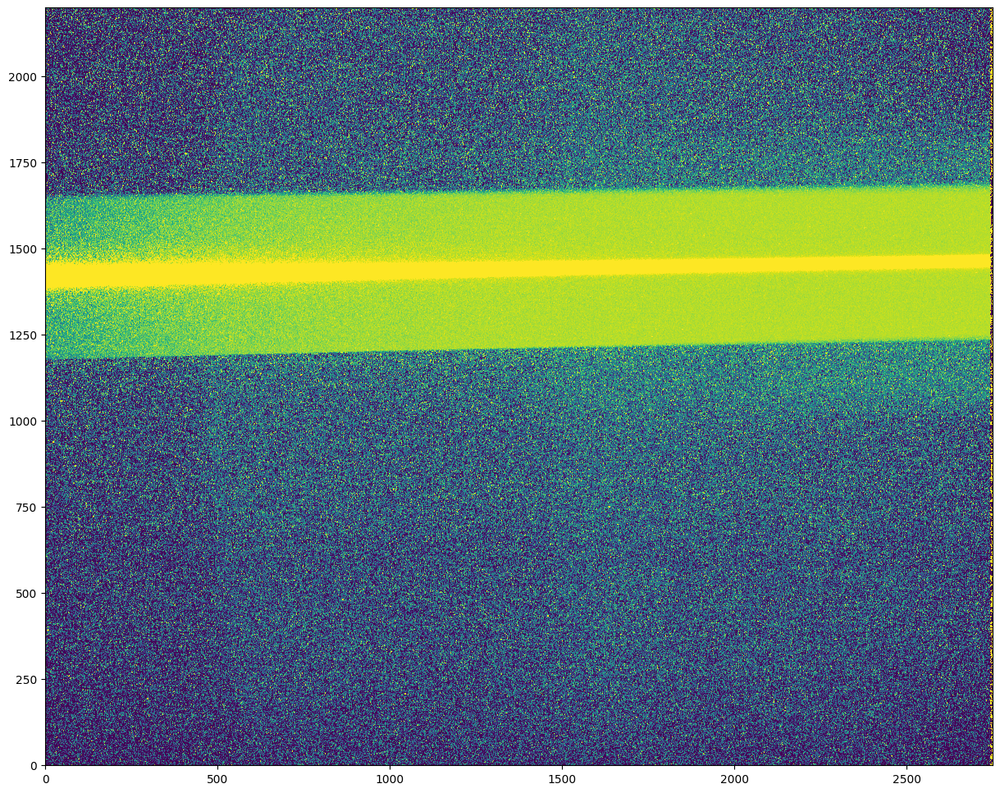

In [67]:
plt.imshow(IMMAG_data,clim=[-50,4])

IMMAG_0 = IMMAG_data-masterbias
IMMAG_0_flat = IMMAG_0/normflat
#plot the image
plt.imshow(IMMAG_0_flat,clim=[-50,4], origin='lower')

## Subregion selection
(to do on science frame, not on mean_flat, following code just to show the method)

In [68]:
width=60 #number of pixel above and below the star to consider
ycent = 1435
mask = np.zeros_like(masterflat)
for i in range(nx):
    mask[edgedn_conv[i]:edgeup_conv[i],i] = 1
    normflat[edgedn_conv[i]:edgeup_conv[i],i] = normflat[edgedn_conv[i]:edgeup_conv[i],i]/np.median(normflat[edgedn_conv[i]:edgeup_conv[i],i])
    
plt.show()

/home/omirako/.local/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/omirako/.local/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


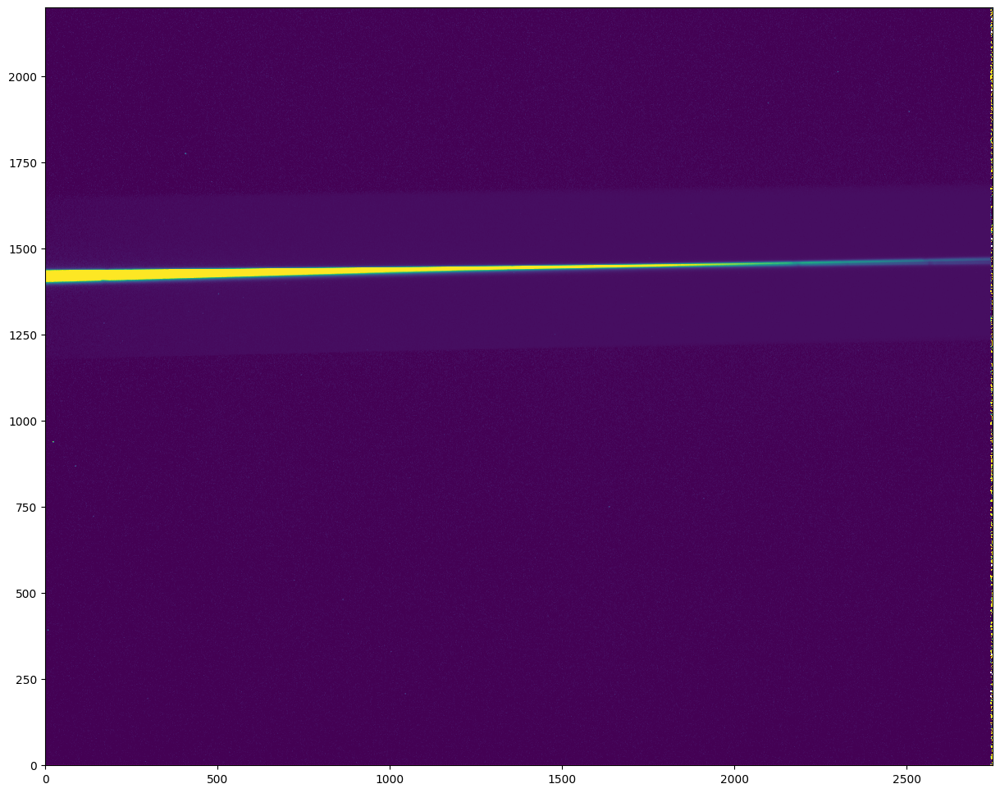

In [69]:
stripe_cen_up = np.zeros(nx)
stripe_cen_dn = np.zeros(nx)

#plot stripe
plt.imshow(IMMAG_0_flat,clim=[-40,1000], origin='lower')

plt.scatter(xarr,stripe_cen_up,s=0.001,c='m')
plt.scatter(xarr,stripe_cen_dn,s=0.001,c='m')

plt.savefig("IMMAG_stripe_center.png")

plt.show()



In [70]:
#Sum the image along the rows to obtain a spectrum of the source
star_spec = np.sum(IMMAG_0_flat[ycent-width:ycent+width,:], axis=0)

star_spec = np.array(star_spec)

Flux of the source in counts

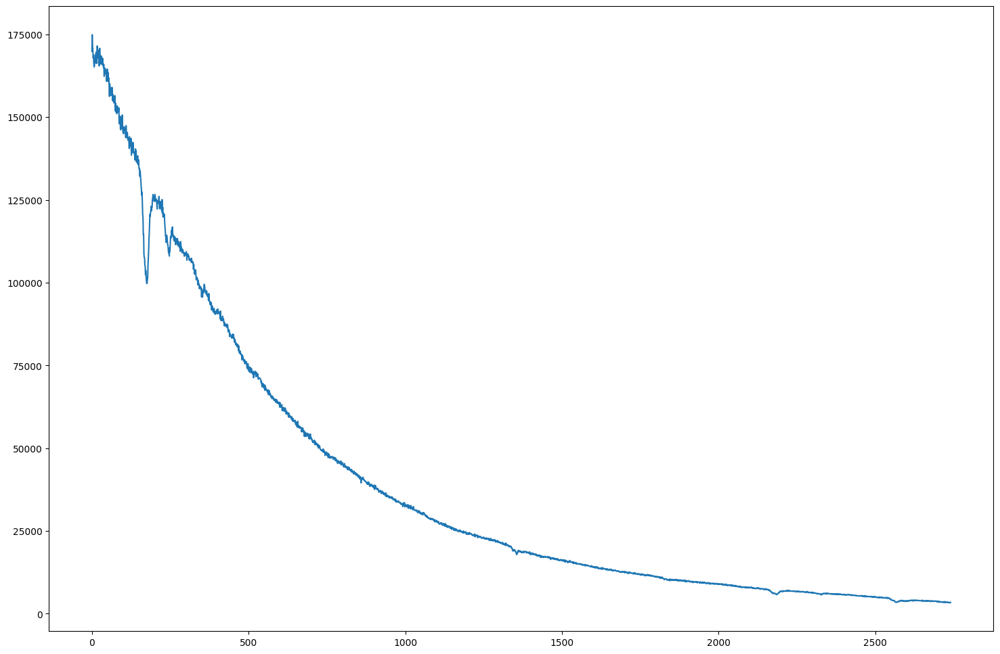

In [71]:
plt.plot((star_spec)[:-9])

# Wavelenght mapping

In [85]:
files_arc = glob.glob(path_drive+"arc/*.fit")

In [73]:
#Stack arc frames, subtract the bias

arc = np.zeros((len(files_arc),ny,nx))

for ind, ff in enumerate(files_arc):
    hdu = fits.open(ff)
    arc[ind,...] = hdu[0].data - masterbias
    hdu.close()
    
meanarc = np.mean(arc, axis=0)
del arc

arc frames, we extract a narrow 1d spectrum and we get what is below this image

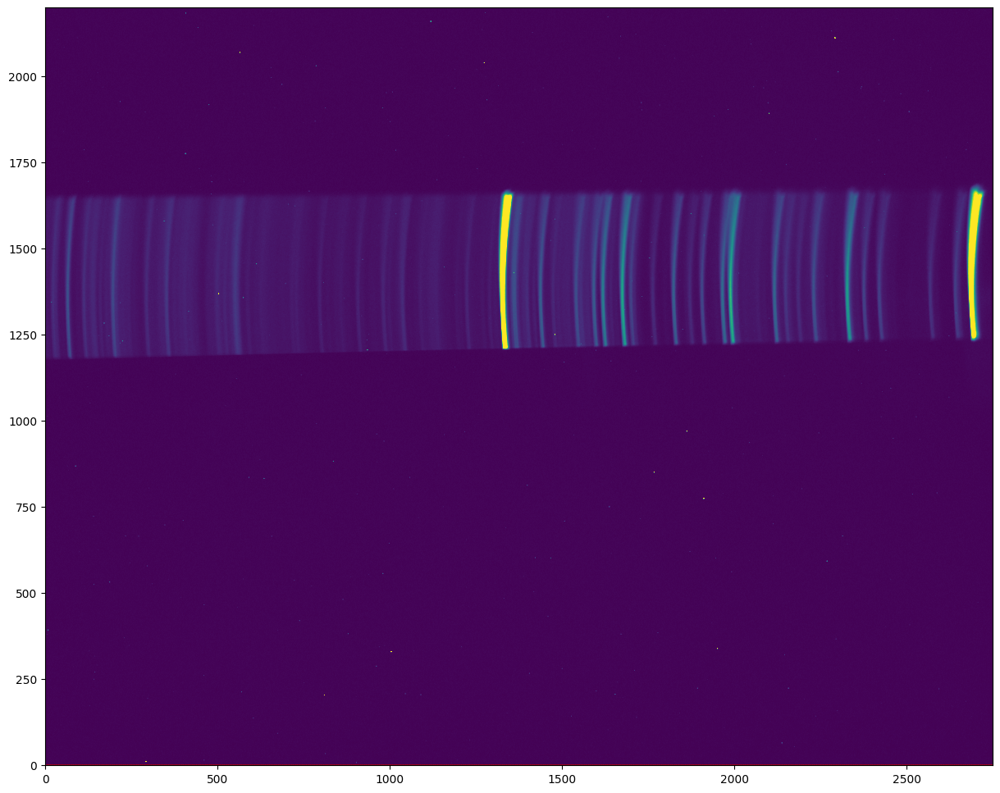

In [74]:
plt.imshow(meanarc, clim=[0,1200], origin='lower')
plt.scatter(range(len(stripe_cen_up)),stripe_cen_up,s=0.01,c='r')
plt.scatter(range(len(stripe_cen_dn)),stripe_cen_dn,s=0.01,c='r')

In [75]:
#extract arc in the same region where you extracted the source spectrum
stripe_sum_peaks = np.sum(meanarc[ycent-width:ycent+width,:], axis=0)

stripe_sum_peaks.shape[0]

2750

Identify peaks in the 1d spectrum

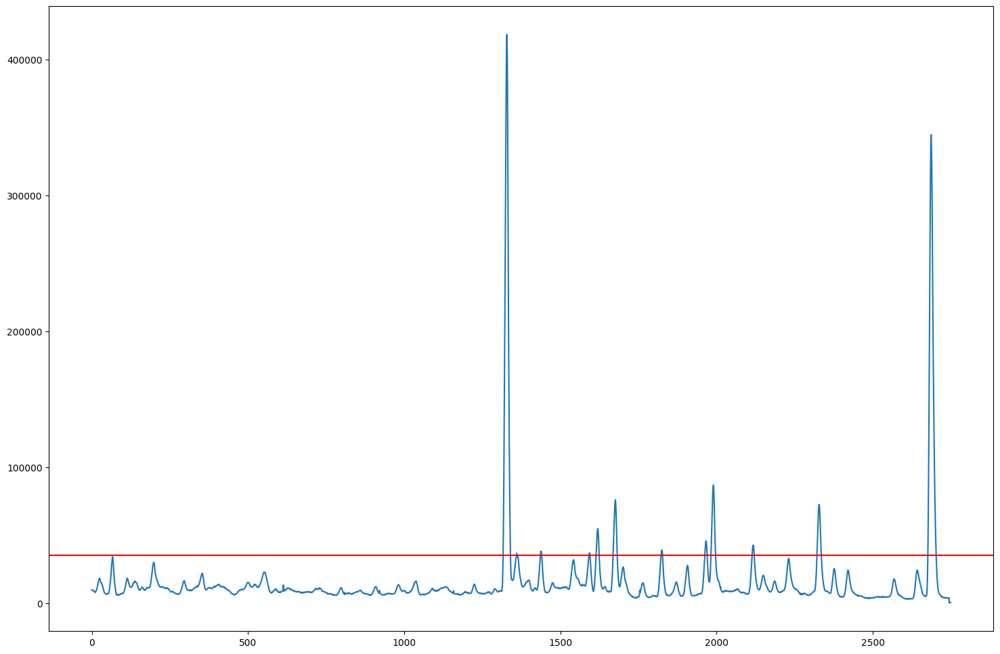

In [76]:
plt.plot(stripe_sum_peaks)
yheight=35000
plt.axhline(y=yheight, color='r', linestyle='-')

In [77]:
from scipy.signal import find_peaks

x = stripe_sum_peaks

peaks, _ = find_peaks(x, height=yheight)

In [78]:
stripe_sum_peaks

array([9474.2       , 9348.8       , 9539.86666667, ...,  412.13333333,
        220.73333333,  287.8       ])

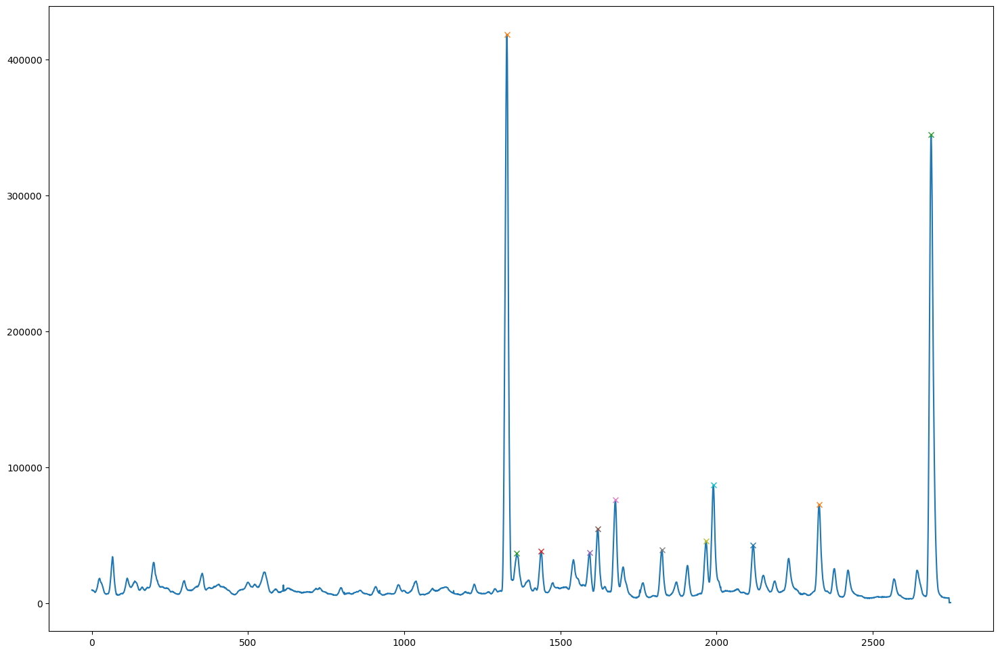

In [79]:
plt.plot(x)
for i in range(0, len(peaks)):
    plt.plot(peaks[i], x[int(peaks[i])], "x")
plt.show()

In [105]:
from statistics import LinearRegression


def pixel_to_wavelenght(pixel):
    regr = LinearRegression()
    return regr.coef_[0]*pixel + regr.intercept_

## Using tabulated arc lines

In [81]:
#image from http://www.astrophoto.at/calibration-arne.html

In [82]:
wavelenght_calib_red = [5852.488, 5944.834, 6074.338, 6096.163, 6143.063, 6266.495, 6382.992, 6402.246, 6506.528, 6678.276,6965.491]
print('Number of identified lines in red: {}'.format(len(wavelenght_calib_red)))


Number of identified lines in red: 11


### Run calib in red

In [106]:
x = stripe_sum_peaks
x = pixel_to_wavelenght(x)
yheight_accu=20000
peaks_red, _ = find_peaks(x, height=yheight_accu)
peaks_red

TypeError: LinearRegression.__new__() missing 2 required positional arguments: 'slope' and 'intercept'

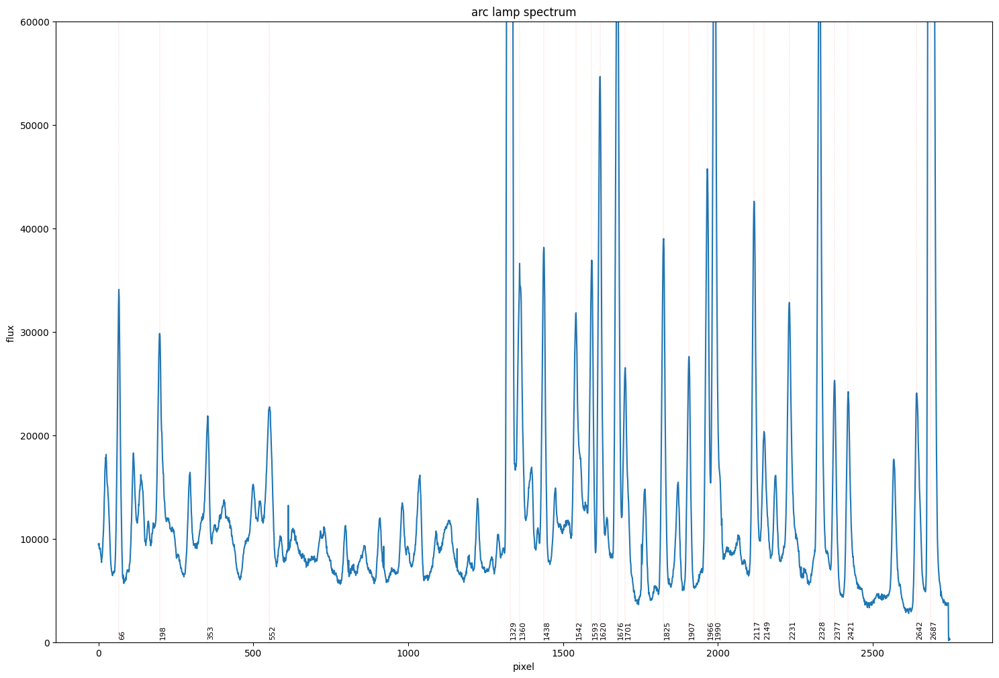

In [99]:
plt.plot(x)
plt.xlabel("pixel")
plt.ylabel("flux ")
plt.title("arc lamp spectrum")
for i in peaks_red:
        plt.text(i, 400, f'{i}', rotation=90,size=8)
        plt.axvline(x=i, color='r', linestyle='dashdot', linewidth=0.1)
plt.ylim((0,60000))
plt.savefig("calibration_pix_red.png", dpi=450)


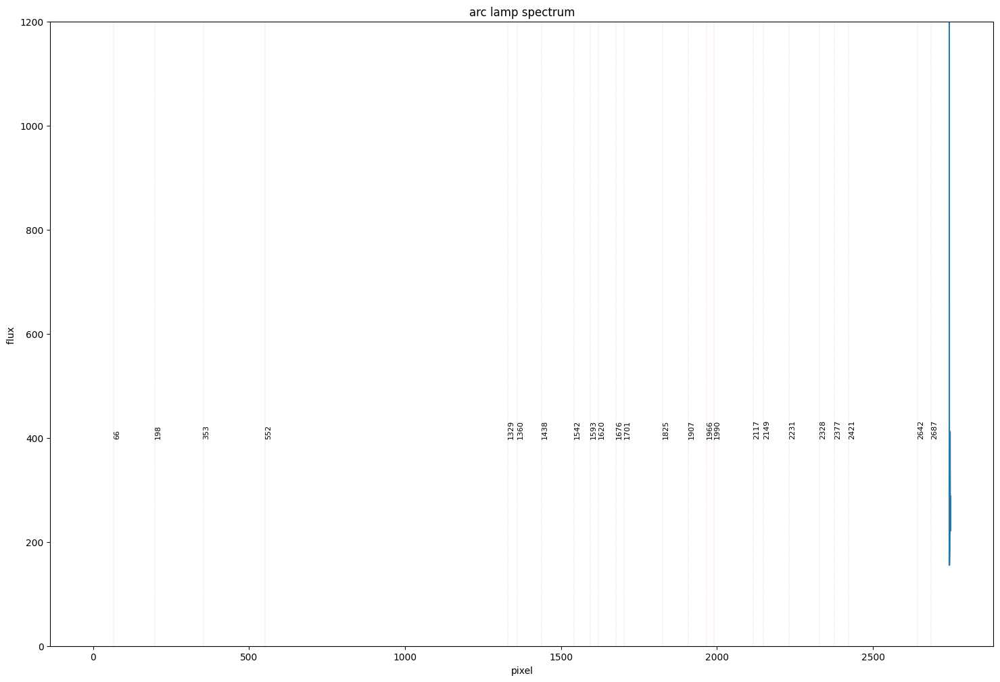

In [37]:
plt.plot(stripe_sum_peaks)
plt.xlabel("pixel")
plt.ylabel("flux ")
plt.title("arc lamp spectrum")
for i in peaks_red:
        plt.text(i, 400, f'{i}', rotation=90,size=8)
        plt.axvline(x=i, color='r', linestyle='dashdot', linewidth=0.1)
plt.ylim((0,1200))
plt.savefig("calibration_pix_red.png", dpi=450)

X axis the position of the detector  
Y axis the wavelegth

ValueError: x and y must have same first dimension, but have shapes (24,) and (11,)

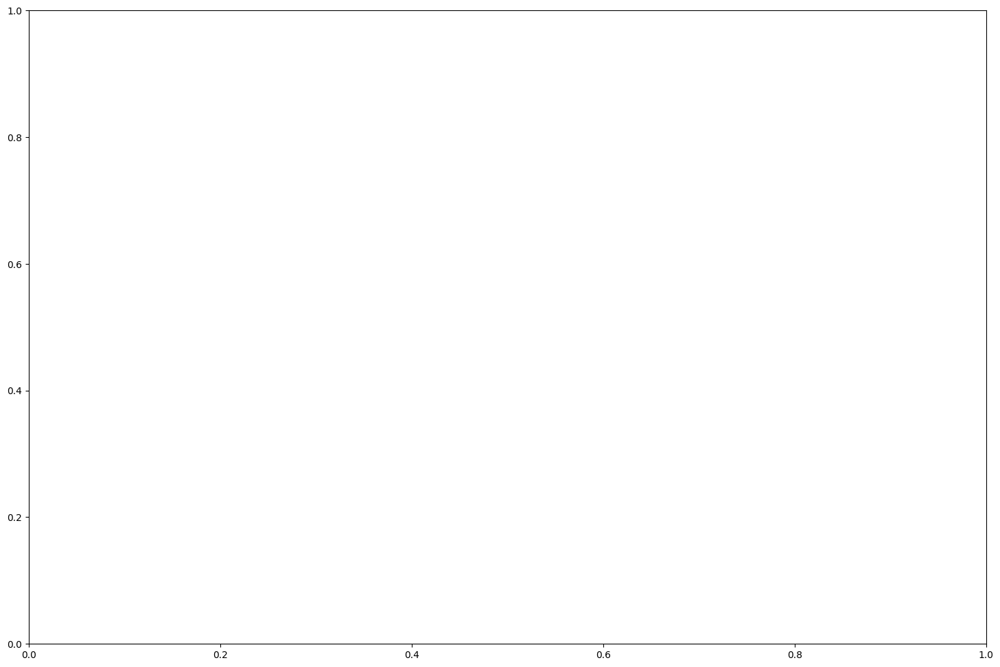

In [38]:
plt.plot(peaks_red, wavelenght_calib_red, '--', color="gray")
plt.scatter(peaks_red, wavelenght_calib_red)
for i, j in zip(peaks_red, wavelenght_calib_red):
   plt.text(i, j+0.5, '({}, {})'.format(i, j))

Text(0, 0.5, 'wavelenght')

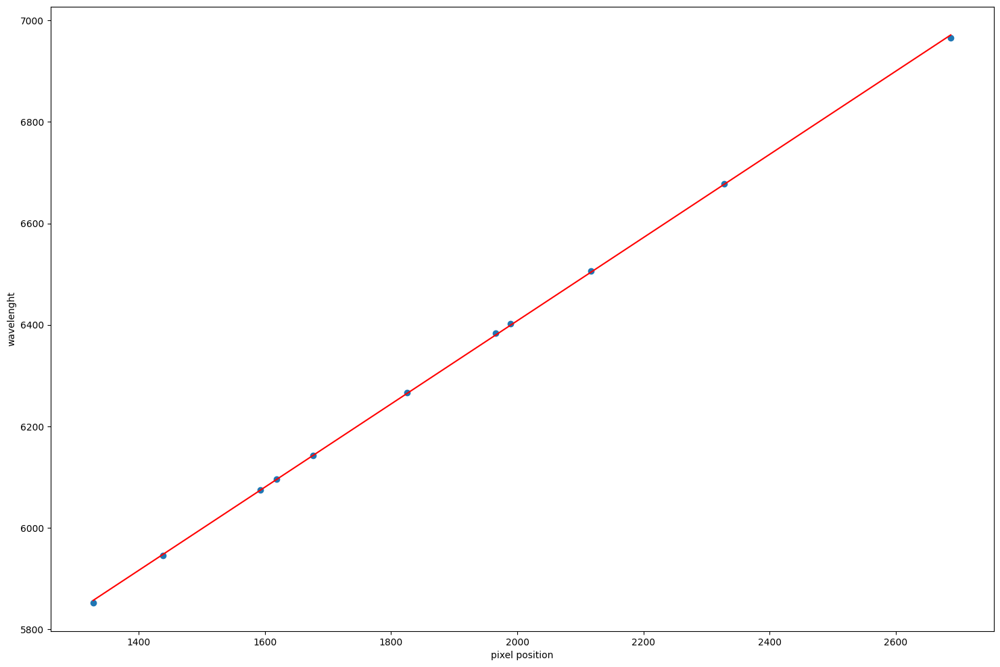

In [ ]:
# Create linear regression object
fit_red = np.polyfit(peaks_red,wavelenght_calib_red,1)
wavelenght_pred_red = np.polyval(fit_red, peaks_red)

# Plot outputs
plt.scatter(peaks_red, wavelenght_calib_red)
plt.plot(peaks_red, wavelenght_pred_red, color="red")
plt.xlabel("pixel position")
plt.ylabel("wavelenght")

In [ ]:
print("The conversion between pixel and wavelenght is: lambda = ", round(fit_red[0],4), "* pixel + ", round(fit_red[1],2))

The conversion between pixel and wavelenght is: lambda =  0.8201 * pixel +  4767.89


### Run calib in blu

In [ ]:
x = stripe_sum_peaks
yheight_accu=160
#Now repeat in the blue part of the spectrum, find the four strongest peaks above 160 counts

In [ ]:
peaks_blue = np.delete(peaks_blue, (3,5))
peaks_blue

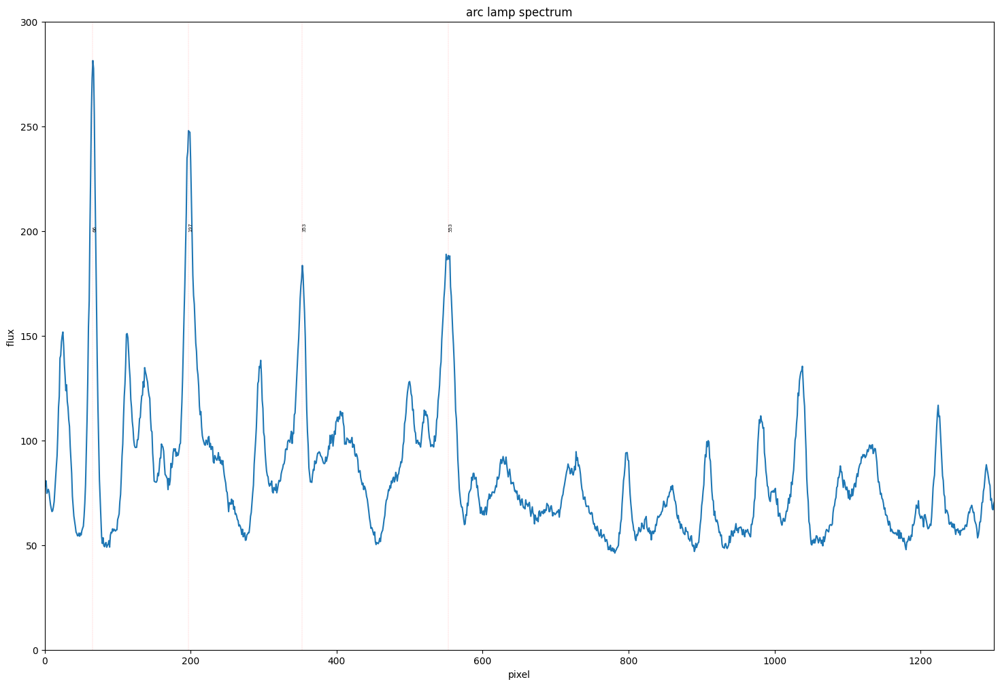

In [ ]:

plt.plot(stripe_sum_peaks)
plt.xlabel("pixel")
plt.ylabel("flux ")
plt.title("arc lamp spectrum")
for i in peaks_blue:
        plt.text(i, 200, f'{i}', rotation=90,size=5)
        plt.axvline(x=i, color='r', linestyle='dashdot', linewidth=0.1)
plt.ylim(0,300)
plt.xlim(0,1300)
plt.savefig("calibration_pix_blu.png", dpi=450)

In [ ]:
wavelenght_calib_blu = [4764.865, 4879.209, 5017.163, 5187.746]
print('Number of identified lines in blue: {}'.format(len(wavelenght_calib_blu)))

Number of identified lines in blue: 4


In [ ]:
print("the conversion between pixel and wavelenght is: lambda = ", round(fit_blue[0],4), "* pixel + ", round(fit_blue[1],2))

the conversion between pixel and wavelenght is: lambda =  0.8693 * pixel +  4708.18


In [ ]:
peaks_all = []
peaks_all[:4] = peaks_blue
peaks_all[4:] = peaks_red
print(peaks_all)

wavelenght_calib_all = []
wavelenght_calib_all[:4] = wavelenght_calib_blu
wavelenght_calib_all[4:] = wavelenght_calib_red
print(wavelenght_calib_all)

### Regression of both blue and red

In [ ]:
# Create linear regression object for blue and red at the same time

In [ ]:

print("the wavelenght solution (only red) is: lambda = ", round(fit_red[0],4), "* pixel + ", round(fit_red[1],2))
print("the wavelenght solution (only blu) is: lambda = ", round(fit_blue[0],4), "* pixel + ", round(fit_blue[1],2))
print("the wavelenght solution (blu and red) is: lambda = ", round(fit_all[0],4), "* pixel + ", round(fit_all[1],2))

the wavelenght solution (only red) is: lambda =  0.8201 * pixel +  4767.89
the wavelenght solution (only blu) is: lambda =  0.8693 * pixel +  4708.18
the wavelenght solution (blu and red) is: lambda =  0.844 * pixel +  4721.2


In [ ]:
def pixel_to_wavelength(pixel):
    return fit_all[0]*pixel + fit_all[1]

# Flux calibration

In [ ]:
wave = pixel_to_wavelength(xarr)
flux=star_spec


wave = wave[:-9]
flux = flux[:-9]

Text(0, 0.5, 'flux ')

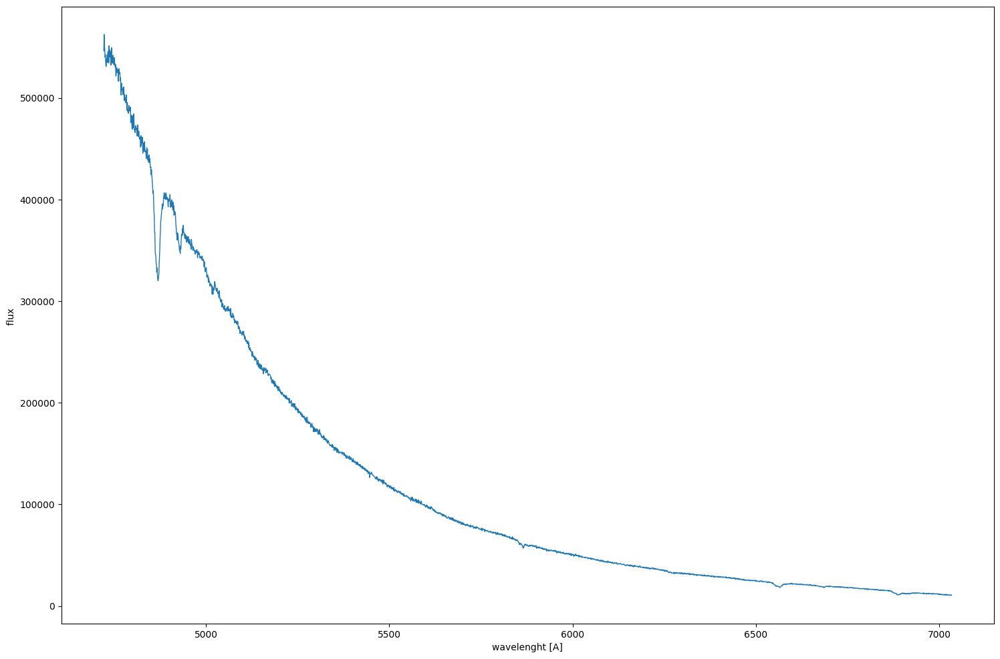

In [ ]:
#plot std_flux vs wavelenght
plt.plot(wave, flux, linewidth=1.0)
plt.xlabel("wavelenght [A]")
plt.ylabel("flux ")

In [ ]:
HD3360_emissions = pd.read_csv(path_drive+"science/fhr153.dat",sep=r"\s+",header=None,names=["wavelength_A","flux_ergs/cm/cm/s/A","flux_milli_Jy"])
wlen_std = HD3360_emissions['wavelength_A'].to_numpy()
flux_std = HD3360_emissions['flux_ergs/cm/cm/s/A'].to_numpy()

In [ ]:
#Flux is in units of 1E-16 erg/ s / cm^2 /A

In [ ]:
cut = wlen_std>4750
wlen_std = wlen_std[cut]
flux_std = flux_std[cut]

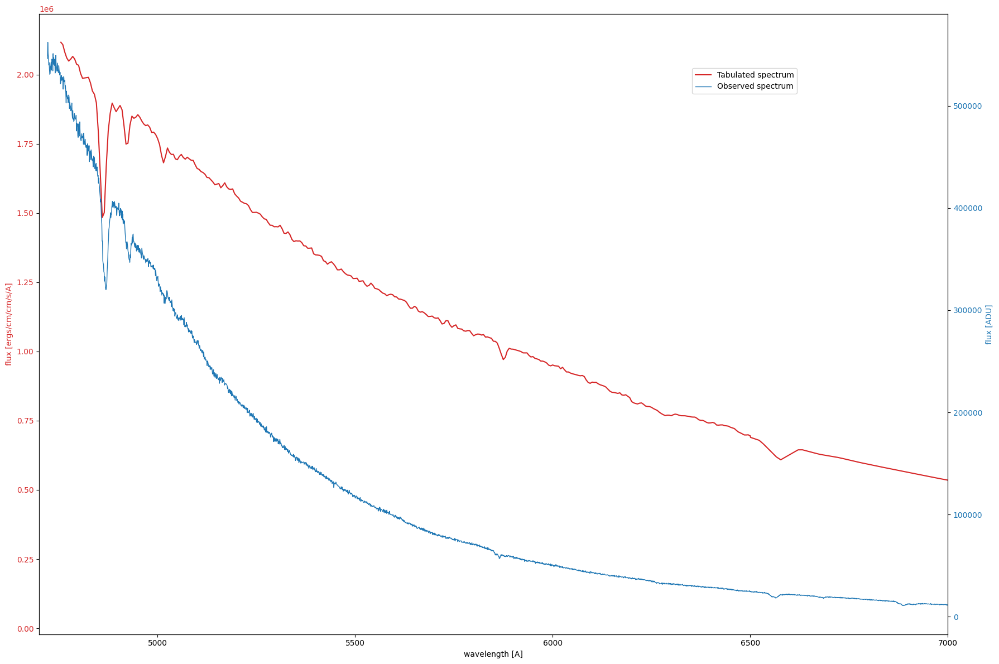

<Figure size 12500x10000 with 0 Axes>

In [ ]:
#plot std_star_spectrum_tabulated and STD_flux_WV on two Y axis twinned
fig, ax1 = plt.subplots()
plt.figure(figsize=(25, 20), dpi=500)
color = 'tab:red'
ax1.set_xlabel('wavelength [A]')
ax1.set_ylabel('flux [ergs/cm/cm/s/A]', color=color)
ax1.plot(wlen_std, flux_std, color=color, label="Tabulated spectrum")
ax1.tick_params(axis='y', labelcolor=color)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('flux [ADU]', color=color)  # we already handled the x-label with ax1
ax2.plot(wave, flux, color=color, linewidth=1, label="Observed spectrum")
ax2.tick_params(axis='y', labelcolor=color)
ax1.set_xlim(4700,7000)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
fig.legend(bbox_to_anchor=(0.8, 0.9))